# Reproduction Package for Experiment Analysis

## Utils

In [1]:
import os
import copy
import json
import pandas as pd
import dspy
from analysis.load_data import prepare_data
from analysis.judge import LLMJudge

PROMPT_SUBSET_LABELS = [
    "original",
    "edited",
    "paraphrased",
    "fixed",
    "removed",
    "optimized",
    "task_only",
]

PROMPT_SUBSET_CATEGORIES = {
    "original": ["original"],
    "edited": ["edited"],
    "paraphrased": ["paraphrased"],
    "fixed": ["fixed"],
    "removed": ["removed"],
    "removed_partial": ["removed_0", "removed_1", "removed_2", "removed_3"],
    "og vs. optimized": ["original", "optimized"],
    "repeated": ["original_samples"],
    "fixed_samples": ["fixed_samples"],
}

def flatten_list(lst):
    return [item for sublist in lst for item in sublist]

def key_in_subset(key, prompt_subsets): 
    return any([
        key == subset if subset == "original" else key.startswith(subset) for subset in prompt_subsets
    ])

def find_subset(category, keys):
    if category not in PROMPT_SUBSET_CATEGORIES:
        return [key for key in keys if key.startswith(category)]
    return PROMPT_SUBSET_CATEGORIES[category]


def query_data(
    task,
    model_names,
    prompt_categories,
    configs={},
):
    task_description, TaskProgram, trainset, valset, requirements, prompts = prepare_data(task_name=task, configs=configs)
    task_program = TaskProgram(lm=None)

    requirements_strs = [requirement["requirement"] for requirement in requirements]


    prompt_keys = list(prompts.keys())
    for prompt_name in prompt_keys:
        prompts[prompt_name + "_samples_10"] = prompts[prompt_name]
        for i in range(1, 10):
            prompts[f"{prompt_name}_samples_10_{i}"] = prompts[prompt_name]
        
    prompt_subsets = {
        cat: [k for k, v in prompts.items() if key_in_subset(k, find_subset(cat, prompts.keys()))] for cat in prompt_categories
    }
    all_prompt_keys = flatten_list(list(prompt_subsets.values()))


    # filter prompts based on the selected categories
    prompts = {
        k: v for k, v in prompts.items() if k in all_prompt_keys
    }

    judge = LLMJudge(task_description=task_description, lm=None)
    all_pass_rates = {}
    all_examples = []
    for model_name in model_names:
        for prompt_name, prompt in prompts.items():
            if not os.path.exists(f"data/results/{task}/{model_name}_{prompt_name}_valset_evaluated.json"):
                continue
            with open(f"data/results/{task}/{model_name}_{prompt_name}_valset_evaluated.json", "r") as f:
                evaluate_examples = json.load(f)
            evaluate_examples = [dspy.Example(**example).with_inputs(task_program.input_key) for example in evaluate_examples]

            pass_rates = {}
            L = len(evaluate_examples[0]["outputs"])
            for i in range(L):
                for example in evaluate_examples:
                    example.requirements = example["requirements_dict"][str(i)]
                for requirement in requirements_strs:
                    applicable_ratio, pass_rate = judge.calculate_score(evaluate_examples, requirement)
                    # print(requirement, applicable_ratio)
                    pass_rates[requirement] = pass_rate
                prompt_name_ = prompt_name + "_" + str(i) if i > 0 else prompt_name
                all_pass_rates[(model_name, prompt_name_)] = copy.deepcopy(pass_rates)


    df = pd.DataFrame(all_pass_rates).astype(float)

    return {
        "df": df,
        "examples": all_examples,
        "requirements": requirements,
        "prompt_subsets": prompt_subsets,
    }

def load_result(task, model_names, prompt_subsets, configs):
    task_description, TaskProgram, trainset, valset, requirements, prompts = prepare_data(
        task_name=task,
        configs=configs,
    )
    
    
    results_a = query_data(
        task, 
        model_names,
        prompt_subsets,
        configs=configs,
    )
    
    df, requirements, prompt_subsets = results_a["df"], results_a["requirements"], results_a["prompt_subsets"]

    def label_specified(prompt, requirement):
        specified_requirements = []
        
        if prompt.startswith("optimized"):
            prompt = "_".join(prompt.split("_")[-2:])
    
        if prompt == "structured" or prompt == "original":
            specified_requirements += [req["requirement"] for req in requirements if req["source"] == "prompt"]
        elif prompt == "structured-reversed":
            specified_requirements += [req["requirement"] for req in requirements if req["source"] != "prompt"]
        elif prompt.startswith("fixed"):
            indices = prompt.split("_")[1].split("+")
            indices = [int(i) for i in indices]
            specified_requirements += [req["requirement"] for i, req in enumerate(requirements) if i in indices]
        elif prompt == "task-only":
            pass
        else:
            return None
    
        return "specified" if requirement in specified_requirements else "unspecified"
    
    def num_requirement(prompt):
        specified_requirements = []
    
        if prompt.startswith("optimized"):
            prompt = "_".join(prompt.split("_")[-2:])
        
        if prompt == "structured" or prompt == "original":
            specified_requirements += [req["requirement"] for req in requirements if req["source"] == "prompt"]
        elif prompt == "structured-reversed":
            specified_requirements += [req["requirement"] for req in requirements if req["source"] != "prompt"]
        elif prompt.startswith("fixed"):
            indices = prompt.split("_")[1].split("+")
            indices = [int(i) for i in indices]
            specified_requirements += [req["requirement"] for i, req in enumerate(requirements) if i in indices]
    
        return len(specified_requirements)

    
    df_long = df.stack(level=[0, 1]).reset_index()
    df_long.columns = ['requirement', 'model', 'prompt', 'accuracy']
    
    df_long["requirement_type"] = df_long.apply(lambda row: label_specified(row["prompt"], row["requirement"]), axis=1)
    df_long["requirement_num"] = df_long.apply(lambda row: num_requirement(row["prompt"]), axis=1)
    df_long = df_long[df_long["requirement_type"].notna()]
    
    requirements_dict = {req["requirement"]: req for req in requirements}
    df_long['requirement_source'] = df_long['requirement'].apply(lambda x: requirements_dict[x]["source"])
    
    
    df_long["optimizer"] = df_long["prompt"].apply(lambda x: x.split("_")[-3] if x.startswith("optimized") else "none")
    
    df_long['prompt'] = df_long['prompt'].apply(lambda x: x.split("_samples_10_")[0])
    
    df_long['prompt_content'] = df_long['prompt'].map(lambda x: prompts[x])
    
    df_long['task'] = task
    
    return df_long

/Users/chenyang/Projects/underspec-analysis/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Section 3.2

In [2]:
model_names = [
    "llama3.3-70b",
    "gpt-4o", 
    "o3-mini"
]

dfs = [ 
    load_result(
        task = "product",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/product_n10.json",
            ],
        }
    ),
    load_result(
        task = "commitpack",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/commitpack_n10.json",
            ],
        }
    ),
    load_result(
        task = "trip",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/trip_n10.json",
            ],
        }
    )
]

df_long = pd.concat(dfs)
requirements_df = pd.read_csv('data/all-requirements.csv')

df_long = df_long.merge(requirements_df, on='requirement')

/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes

In [3]:
df_group = df_long.groupby(["model", "requirement", "requirement_type"]).agg({"accuracy": ["mean", "min", "max", "std"]}).reset_index()
df_group.columns = ['_'.join(map(str, col)).rstrip('_') for col in df_group.columns.values]
df_group['descrp'] = df_group.apply(lambda row: "{:.2f}±{:.2f}".format(row['accuracy_mean'], row['accuracy_std']), axis=1)
df_group

,model,requirement,requirement_type,accuracy_mean,accuracy_min,accuracy_max,accuracy_std,descrp
0,gpt-4o,"If technical jargon is used, the output should...",specified,1.000000,1.000000,1.000000,0.000000,1.00±0.00
1,gpt-4o,"If technical jargon is used, the output should...",unspecified,0.999000,0.990000,1.000000,0.003162,1.00±0.00
2,gpt-4o,"If there are error handling mechanisms, the ou...",specified,0.985881,0.970588,1.000000,0.011815,0.99±0.01
3,gpt-4o,"If there are error handling mechanisms, the ou...",unspecified,0.718421,0.482759,0.842105,0.138959,0.72±0.14
4,gpt-4o,The explanation should include potential appli...,specified,0.993000,0.950000,1.000000,0.016364,0.99±0.02
...,...,...,...,...,...,...,...,...
355,o3-mini,The output should specify if transportation op...,unspecified,0.351971,0.150000,0.500000,0.103712,0.35±0.10
356,o3-mini,The output should use analogies and examples t...,specified,0.958000,0.860000,1.000000,0.047093,0.96±0.05
357,o3-mini,The output should use analogies and examples t...,unspecified,0.075000,0.000000,0.150000,0.051262,0.07±0.05
358,o3-mini,The product description should mention any per...,specified,0.992392,0.974359,1.000000,0.008932,0.99±0.01


In [4]:
import altair as alt
import pandas as pd

df_plot = df_group.copy()
df_plot['model'] = pd.Categorical(df_plot['model'], categories=model_names, ordered=True)
df_plot['model'] = df_plot['model'].replace("gpt-4o", "gpt-4o-2024-08-06")


agg = alt.Chart(df_plot).transform_aggregate(
    mean='mean(accuracy_mean)',
    stdev='stdev(accuracy_mean)',
    groupby=['requirement_type']
).transform_calculate(
    lower='datum.mean - datum.stdev',
    upper='datum.mean + datum.stdev'
)

errorbar = agg.mark_errorbar().encode(
    x=alt.X('lower:Q', title=""),
    x2='upper:Q',
    y=alt.Y('requirement_type:N', title=""),
    color=alt.Color('requirement_type:N', scale=alt.Scale(scheme='tableau10'), legend=None)
)

mean_points = agg.mark_point(filled=True, color='black').encode(
    x=alt.X('mean:Q', title="avg. accuracy"),
    y='requirement_type:N',
    color=alt.Color('requirement_type:N', scale=alt.Scale(scheme='tableau10'), legend=None)
)

chart = (errorbar + mean_points).properties(
    title='',
    width=150,
    height=40,
)
chart

/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3333880556.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df_plot['model'] = df_plot['model'].replace("gpt-4o", "gpt-4o-2024-08-06")


alt.LayerChart(...)

In [5]:
df_pivot = df_group.pivot(index=['model', 'requirement'], columns='requirement_type', values='accuracy_mean').reset_index()
df_pivot['diff'] = df_pivot['unspecified'] - df_pivot['specified']
df_pivot['diff'].describe()

count    180.000000
mean      -0.225996
std        0.285504
min       -0.930768
25%       -0.428192
50%       -0.078739
75%       -0.001000
max        0.496000
Name: diff, dtype: float64

In [6]:
df_unspecified = df_long[df_long['requirement_type'] == 'unspecified'].reset_index()
df_unspecified['satisfied'] = df_unspecified['accuracy'] >= 0.98
df_unspecified

,index,requirement,model,prompt,accuracy,requirement_type,requirement_num,requirement_source,optimizer,prompt_content,task,category,scope,source,satisfied
0,1,The output must ensure that key product inform...,gpt-4o,fixed_1+2+3+4+5+6+7+8+9+10,0.00,unspecified,10,bottom-up,none,Write engaging product description from the co...,product,style,global,bottom-up,False
1,2,The output must ensure that key product inform...,gpt-4o,fixed_2+3+4+5+6+7+8+9+10+11,0.07,unspecified,10,bottom-up,none,Write engaging product description from the co...,product,style,global,bottom-up,False
2,3,The output must ensure that key product inform...,gpt-4o,fixed_3+4+5+6+7+8+9+10+11+12,0.07,unspecified,10,bottom-up,none,Write engaging product description from the co...,product,style,global,bottom-up,False
3,4,The output must ensure that key product inform...,gpt-4o,fixed_4+5+6+7+8+9+10+11+12+13,0.94,unspecified,10,bottom-up,none,Write engaging product description from the co...,product,style,global,bottom-up,False
4,5,The output must ensure that key product inform...,gpt-4o,fixed_5+6+7+8+9+10+11+12+13+14,0.72,unspecified,10,bottom-up,none,Write engaging product description from the co...,product,style,global,bottom-up,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1795,3585,"The output should be friendly, casual, and ent...",o3-mini,fixed_5+6+7+8+9+10+11+12+13+14,0.26,unspecified,10,prompt,none,"Provide personalized travel recommendations, i...",trip,style,global,prompt,False
1796,3586,"The output should be friendly, casual, and ent...",o3-mini,fixed_6+7+8+9+10+11+12+13+14+15,0.23,unspecified,10,prompt,none,"Provide personalized travel recommendations, i...",trip,style,global,prompt,False
1797,3587,"The output should be friendly, casual, and ent...",o3-mini,fixed_7+8+9+10+11+12+13+14+15+16,0.20,unspecified,10,prompt,none,"Provide personalized travel recommendations, i...",trip,style,global,prompt,False
1798,3588,"The output should be friendly, casual, and ent...",o3-mini,fixed_8+9+10+11+12+13+14+15+16+17,0.95,unspecified,10,prompt,none,"Provide personalized travel recommendations, i...",trip,style,global,prompt,False


In [7]:
print(
    "Average guess rate:", df_unspecified['satisfied'].mean(), "\n",
    "At least once guess rate:", df_unspecified.groupby('requirement').agg({'satisfied': 'max'}).reset_index()['satisfied'].mean()
)

Average guess rate: 0.4111111111111111 
 At least once guess rate: 0.65


In [8]:
import altair as alt

# df_unspecified
df_plot = df_unspecified.groupby('model')['satisfied'].mean().reset_index()
df_plot['model'] = df_plot['model'].replace("gpt-4o", "gpt-4o-2024-08-06")
df_plot = df_plot[df_plot['model'].isin(['llama3.3-70b', 'gpt-4o-2024-08-06', 'o3-mini'])]

# Create bar plot
chart2 = alt.Chart(df_plot).mark_bar().encode(
    x=alt.X('satisfied:Q', title='% unspecified requirements guessed', axis=alt.Axis(format="%")),
    y=alt.Y('model:N', sort=['llama3.3-70b', 'gpt-4o-2024-08-06', 'o3-mini'], title=''),
    color=alt.value('#ff7f0e'),
    tooltip=['model', 'satisfied']
).properties(
    title='',
    width=150,
    height=40,
)

chart2

# (chart & chart2).save("implicit_reqs.pdf")

alt.Chart(...)

In [9]:
display(df_plot)
print("Increased from o3-mini vs. llama3.3-70b:", df_plot.iloc[2]['satisfied'] / df_plot.iloc[1]['satisfied'] - 1)

,model,satisfied
0,gpt-4o-2024-08-06,0.415000
1,llama3.3-70b,0.371667
2,o3-mini,0.446667


Increased from o3-mini vs. llama3.3-70b: 0.2017937219730943


In [10]:
print(
    "Average guess rate:", ((df_unspecified['satisfied'])).mean(), "\n",
)

display(df_unspecified.groupby(['scope']).agg({'satisfied': 'mean'}).reset_index())
display(df_unspecified.groupby(['category']).agg({'satisfied': 'mean'}).reset_index())
display(df_unspecified.groupby(['source']).agg({'satisfied': 'mean'}).reset_index())

Average guess rate: 0.4111111111111111 



,scope,satisfied
0,conditional,0.229167
1,global,0.532407


,category,satisfied
0,content,0.398519
1,format,0.706667
2,style,0.320000


,source,satisfied
0,bottom-up,0.214667
1,prompt,0.652381
2,top-down,0.400000


In [11]:
df_unspecified.groupby(['model', 'scope']).agg({'satisfied': 'mean'}).reset_index()

,model,scope,satisfied
0,gpt-4o,conditional,0.216667
1,gpt-4o,global,0.547222
2,llama3.3-70b,conditional,0.208333
3,llama3.3-70b,global,0.480556
4,o3-mini,conditional,0.262500
5,o3-mini,global,0.569444


In [12]:
df_std = df_group.groupby(['requirement_type']).agg({'accuracy_std': "mean"}).reset_index()
display(df_std)
print(df_std['accuracy_std'][1] / df_std['accuracy_std'][0])

,requirement_type,accuracy_std
0,specified,0.041163
1,unspecified,0.088743


2.1558976127545533


/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/825857623.py:9: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df_plot['model'] = df_plot['model'].replace("gpt-4o", "gpt-4o-2024-08-06")


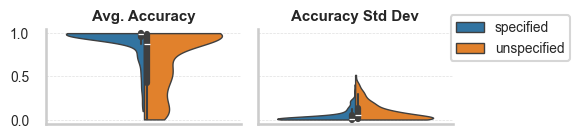

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
from scipy.stats import levene

df_plot = df_group.copy()
df_plot['model'] = pd.Categorical(df_plot['model'], categories=model_names, ordered=True)
df_plot['model'] = df_plot['model'].replace("gpt-4o", "gpt-4o-2024-08-06")

# Set style closer to Altair aesthetics
sns.set_theme(style="whitegrid")
sns.set_context("talk", font_scale=0.6)

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(5, 1.5), sharey=True)

# Plot accuracy_mean
sns.violinplot(
    data=df_plot,
    y='accuracy_mean',
    hue='requirement_type',
    palette="tab10",
    split=True,
    cut=0,
    linewidth=1,
    ax=axes[0]
)
axes[0].set_ylabel("")
axes[0].set_xlabel("")
axes[0].set_title("Avg. Accuracy")
axes[0].spines[['top', 'right']].set_visible(False)
axes[0].grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.6)
axes[0].grid(False, axis='x')
axes[0].legend_.remove()

# Plot accuracy_std
sns.violinplot(
    data=df_plot,
    y='accuracy_std',
    hue='requirement_type',
    palette="tab10",
    split=True,
    cut=0,
    linewidth=1,
    ax=axes[1],
)
axes[1].set_ylabel("")
axes[1].set_xlabel("")
axes[1].set_title("Accuracy Std Dev")
axes[1].spines[['top', 'right']].set_visible(False)
axes[1].grid(True, axis='y', linestyle='--', linewidth=0.5, alpha=0.6)
axes[1].grid(False, axis='x')
axes[1].legend_.remove()
# axes[1].yaxis.set_tick_params(labelleft=True

axes[0].set_title("Avg. Accuracy", fontweight='bold')
axes[1].set_title("Accuracy Std Dev", fontweight='bold')


# Shared legend on the right
handles, labels = axes[1].get_legend_handles_labels()
fig.legend(
    handles, labels,
    title="",
    bbox_to_anchor=(0.9, 0.7),
    loc='center left',
    ncol=1,
    # frameon=False
)

plt.tight_layout(rect=[0, 0, 0.95, 1])  # leave space on the right for the legend
plt.show()

# plt.savefig("accuracy_std_per_model.pdf", bbox_inches='tight')

## Section 3.3

In [14]:
model_names = [
    "llama3-70b",
    "llama3.1-70b",
    "llama3.3-70b",
    "gpt-4o-2024-05-13", 
    "gpt-4o", 
    "gpt-4o-2024-11-20",

]

dfs = [ 
    load_result(
        task = "product",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/product_n10.json",
            ],
        }
    ),
    load_result(
        task = "commitpack",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/commitpack_n10.json",
            ],
        }
    ),
    load_result(
        task = "trip",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/trip_n10.json",
            ],
        }
    )
]

df_long = pd.concat(dfs)

/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes

In [15]:
grouped = (
    df_long.groupby(['model', 'requirement', 'requirement_type', 'prompt'])['accuracy']
    .mean()
    .reset_index()
)

pivot = grouped.pivot_table(
    index=['requirement', 'requirement_type', 'prompt'],
    columns='model',
    values='accuracy'
)

diffs = []
model_pairs = [
    ('llama3-70b', 'llama3.1-70b'),
    ('llama3.1-70b', 'llama3.3-70b'),
    ('llama3-70b', 'llama3.3-70b'),
    ('gpt-4o-2024-05-13', 'gpt-4o'),
    ('gpt-4o-2024-05-13', 'gpt-4o-2024-11-20'),
    ('gpt-4o', 'gpt-4o-2024-11-20'),
]
for (model_a, model_b) in model_pairs:
    
    diff = pivot[model_b] - pivot[model_a]
    diff.name = f"{model_a} → {model_b}"
    diffs.append(diff)

# Step 5: Concatenate diffs into a single DataFrame
diff_df = pd.concat(diffs, axis=1).reset_index()

melted_df = diff_df.melt(
    id_vars=['requirement', 'requirement_type', 'prompt'],
    var_name='model_pair',
    value_name='accuracy_diff'
)

melted_df

,requirement,requirement_type,prompt,model_pair,accuracy_diff
0,"If technical jargon is used, the output should...",specified,fixed_10+11+12+13+14+15+16+17+18+19,llama3-70b → llama3.1-70b,-0.020000
1,"If technical jargon is used, the output should...",specified,fixed_11+12+13+14+15+16+17+18+19+0,llama3-70b → llama3.1-70b,-0.010000
2,"If technical jargon is used, the output should...",specified,fixed_12+13+14+15+16+17+18+19+0+1,llama3-70b → llama3.1-70b,0.000000
3,"If technical jargon is used, the output should...",specified,fixed_13+14+15+16+17+18+19+0+1+2,llama3-70b → llama3.1-70b,-0.010000
4,"If technical jargon is used, the output should...",specified,fixed_14+15+16+17+18+19+0+1+2+3,llama3-70b → llama3.1-70b,0.010000
...,...,...,...,...,...
7195,The product description should mention any per...,unspecified,fixed_15+16+17+18+19+0+1+2+3+4,gpt-4o → gpt-4o-2024-11-20,0.161388
7196,The product description should mention any per...,unspecified,fixed_16+17+18+19+0+1+2+3+4+5,gpt-4o → gpt-4o-2024-11-20,0.102963
7197,The product description should mention any per...,unspecified,fixed_7+8+9+10+11+12+13+14+15+16,gpt-4o → gpt-4o-2024-11-20,0.194854
7198,The product description should mention any per...,unspecified,fixed_8+9+10+11+12+13+14+15+16+17,gpt-4o → gpt-4o-2024-11-20,0.210884


In [16]:
import altair as alt
import pandas as pd
import numpy as np

thresholds = np.linspace(-0.2, 0.0, 21)  # From -0.2 to 0.2 with step of 0.01

# Initialize lists for values
unspecified_props = []
specified_props = []

# Calculate proportion below each threshold
for thresh in thresholds:
    unspecified_prop = (
        (melted_df[melted_df['requirement_type'] == 'unspecified']['accuracy_diff'] < thresh).mean()
    )
    specified_prop = (
        (melted_df[melted_df['requirement_type'] == 'specified']['accuracy_diff'] < thresh).mean()
    )
    unspecified_props.append(unspecified_prop)
    specified_props.append(specified_prop)

# Create DataFrame from threshold values and proportions
plot_df = pd.DataFrame({
    'threshold': list(thresholds) * 2,
    'proportion': unspecified_props + specified_props,
    'requirement_type': ['unspecified'] * len(thresholds) + ['specified'] * len(thresholds)
})

tick_values = np.round(np.arange(-0.20, 0.04, 0.04), 2).tolist()

# Create Altair line chart
chart = alt.Chart(plot_df).mark_line(point=True).encode(
    x=alt.X('threshold:Q', title='Accuracy drop cutoff', scale=alt.Scale(domain=[-0.25, 0.01]), axis=alt.Axis(values=tick_values, tickCount=8, format='%')),
    y=alt.Y('proportion:Q', title=["% of requirements"], axis=alt.Axis(format='%')), # with", "higher accuracy drop"]),
    color=alt.Color('requirement_type:N', title='', 
        legend=alt.Legend(orient="top", direction="horizontal", offset=5))  # Added offset to move right
).properties(
    width=200,
    height=70
)


# Filter for x = -0.2 to get corresponding y-values
highlight_df = plot_df[plot_df['threshold'] == -0.2]

# Vertical line at x = -0.2
rule = alt.Chart(pd.DataFrame({'threshold': [-0.2]})).mark_rule(
    color='gray', strokeDash=[4, 4]
).encode(
    x='threshold:Q'
)

# Text labels for the two points at x = -0.2
text1 = alt.Chart(highlight_df.iloc[:-1]).mark_text(
    align='left',
    dx=-30,  # offset text a bit right
    dy=-6,
).encode(
    x='threshold:Q',
    y='proportion:Q',
    text=alt.Text('proportion:Q', format='.1%'),
    color='requirement_type:N'
)

text2 = alt.Chart(highlight_df.iloc[1:]).mark_text(
    align='left',
    dx=-30,  # offset text a bit right
    dy=3,
).encode(
    x='threshold:Q',
    y='proportion:Q',
    text=alt.Text('proportion:Q', format='.1%'),
    color='requirement_type:N'
)

# Combine base chart with annotations
chart_with_annotation = chart + rule + text1 + text2

chart_with_annotation

# chart_with_annotation.save('regression_plot.pdf')

alt.LayerChart(...)

In [17]:
display(plot_df[(plot_df['threshold'] - -0.2).abs() < 0.001])

print(plot_df['proportion'][0] / plot_df['proportion'][21])

,threshold,proportion,requirement_type
0,-0.2,0.059444,unspecified
21,-0.2,0.030278,specified


1.963302752293578


In [18]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):
    display(melted_df[(melted_df["requirement_type"] == "unspecified") & (melted_df["model_pair"].str.startswith('gpt-4o'))].\
        groupby(['requirement', 'model_pair']).agg({"accuracy_diff": "mean"}).reset_index().sort_values('accuracy_diff')[:10])

,requirement,model_pair,accuracy_diff
34,The output must ensure that key product information is easily skimmable.,gpt-4o-2024-05-13 → gpt-4o,-0.483000
82,"The output should break down complex information into clearer, more concise points.",gpt-4o-2024-05-13 → gpt-4o,-0.483000
51,The output must not use Markdown syntax.,gpt-4o → gpt-4o-2024-11-20,-0.465000
147,The output should not exceed 500 words to maintain conciseness and focus.,gpt-4o → gpt-4o-2024-11-20,-0.223000
83,"The output should break down complex information into clearer, more concise points.",gpt-4o-2024-05-13 → gpt-4o-2024-11-20,-0.222000
98,The output should clearly mention any customer support or warranty information included with the product.,gpt-4o-2024-05-13 → gpt-4o-2024-11-20,-0.211648
57,The output must use engaging and vivid language to capture and retain the reader's attention.,gpt-4o → gpt-4o-2024-11-20,-0.177000
35,The output must ensure that key product information is easily skimmable.,gpt-4o-2024-05-13 → gpt-4o-2024-11-20,-0.159000
97,The output should clearly mention any customer support or warranty information included with the product.,gpt-4o-2024-05-13 → gpt-4o,-0.135767
178,"The product description should mention any personalization options available, including any important limitations or specifications.",gpt-4o-2024-05-13 → gpt-4o,-0.133795


## Section 3.4

In [19]:
import altair as alt
import pandas as pd
import numpy as np

# Function to calculate number of examples needed
def examples_needed(p_detect, target_prob):
    return np.ceil(np.log(1 - target_prob) / np.log(1 - p_detect))

probs = np.linspace(0.05, 1.0, 200)

# Calculate examples needed for different target probabilities
targets = {
    "90% detection probability": 0.90,
    "95% detection probability": 0.95,
    "99% detection probability": 0.99
}

# Create DataFrame for all target probabilities
df_list = []
for label, prob in targets.items():
    examples = [np.log(1 - prob) / np.log(1 - p) for p in probs]
    df = pd.DataFrame({
        'Probability': probs,
        'Examples': examples,
        'Target': [label] * len(probs)
    })
    df_list.append(df)

# Concatenate all into a single DataFrame
df_lines = pd.concat(df_list, ignore_index=True)

# Select only the 95% target points to highlight
highlight_points = [
    {'Probability': 0.05, 'Examples': examples_needed(0.05, 0.95), 'Target': '95% detection probability'},
    {'Probability': 0.10, 'Examples': examples_needed(0.10, 0.95), 'Target': '95% detection probability'},
    {'Probability': 0.20, 'Examples': examples_needed(0.20, 0.95), 'Target': '95% detection probability'},
    {'Probability': 0.30, 'Examples': examples_needed(0.30, 0.95), 'Target': '95% detection probability'},
    {'Probability': 0.40, 'Examples': examples_needed(0.40, 0.95), 'Target': '95% detection probability'},
    {'Probability': 0.50, 'Examples': examples_needed(0.50, 0.95), 'Target': '95% detection probability'},
    {'Probability': 0.99, 'Examples': examples_needed(0.99, 0.95), 'Target': '95% detection probability'},
]

df_points = pd.DataFrame(highlight_points)

# Define color for 95% line
color_scale = alt.Scale(
    domain=['95% detection probability'],
    range=['#ff7f0e']  # Orange color for 95% line
)

# Create line chart with smooth interpolation
line_chart = alt.Chart(df_lines).mark_line(
    interpolate='basis',
    strokeWidth=2.5
).encode(
    x=alt.X('Probability', title=['Probability of discovering a',  'requirement from one example (p)'], 
           scale=alt.Scale(domain=[0.05, 1.0])),
    y=alt.Y('Examples', title=['Number of examples', 'needed (N)'], 
           scale=alt.Scale(domain=[0, 60])),
    color=alt.Color('Target', scale=color_scale, legend=None)
)

# Create points for highlighting
point_shapes = {
    '95% detection probability': 'circle'
}

points_chart = alt.Chart(df_points).mark_point(
    filled=True,
    size=100,
    opacity=0.8
).encode(
    x='Probability',
    y='Examples',
    color=alt.Color('Target', scale=color_scale, legend=None),
    shape=alt.Shape('Target', scale=alt.Scale(domain=list(point_shapes.keys()), 
                                           range=list(point_shapes.values())), 
                  legend=None)
)

# Create text labels for each point
text_chart = alt.Chart(df_points).mark_text(
    align='left',
    baseline='middle',
    dx=7,  # Adjusts text a bit to the right of the point
    dy=-7
).encode(
    x='Probability',
    y='Examples',
    text=alt.Text('Examples:Q', format='.0f'),  # Format to show integer values
    color=alt.value('black')  # Black text color
)

# Combine the charts
chart = (line_chart + points_chart + text_chart)

# chart

vline = alt.Chart(pd.DataFrame({'x': [0.1]})).mark_rule(
    strokeDash=[4, 2],
    color='gray'
).encode(
    x='x:Q'
)

# Text annotation for the vertical line
vline_text = alt.Chart(pd.DataFrame({
    'x': [0.1],
    'y': [55],  # Position the label above the chart line
    'text': ['p = 0.1']
})).mark_text(
    align='left',
    baseline='middle',
    dx=4,
    dy=10,
    angle=0,
    color='gray',
    fontStyle='italic'
).encode(
    x='x:Q',
    y='y:Q',
    text='text:N'
)

# Combine everything
final_chart = (chart + vline + vline_text).properties(
    title=''
).properties(
    width=200,
    height=90,
    title=''
)

final_chart

# final_chart.save("prob-N-plot.pdf")

/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/2112270270.py:21: RuntimeWarning: divide by zero encountered in log
  examples = [np.log(1 - prob) / np.log(1 - p) for p in probs]


alt.LayerChart(...)

In [20]:
chart = alt.Chart(df_lines).mark_line().encode(
    x=alt.X('Probability', title=['Probability of discovering a',  'requirement from one example'], 
           scale=alt.Scale(domain=[0.05, 1.0])),
    y=alt.Y('Examples', title=['Number of examples', 'needed (N)'], 
           scale=alt.Scale(domain=[0, 100])),
    color=alt.Color('Target', legend=None)
).properties(title='Examples Needed vs. Detection Probability')

chart

alt.Chart(...)

## Section 3.5

In [21]:
model_names = [
    "llama3.3-70b",
    "gpt-4o",
]

dfs = [ 
    load_result(
        task = "product",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/product_n1.json",
                "data/prompts/product_n5.json",
                "data/prompts/product_n10.json",
                "data/prompts/product_n19.json",
            ],
        }
    ),
    load_result(
        task = "commitpack",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/commitpack_n1.json",
                "data/prompts/commitpack_n5.json",
                "data/prompts/commitpack_n10.json",
                "data/prompts/commitpack_n19.json",
            ],
        }
    ),
    load_result(
        task = "trip",
        model_names = model_names,
        prompt_subsets = [
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/trip_n1.json",
                "data/prompts/trip_n5.json",
                "data/prompts/trip_n10.json",
                "data/prompts/trip_n19.json",
            ],
        }
    )
]

df_long = pd.concat(dfs)

/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes

In [22]:
import altair as alt
import pandas as pd

# Assuming df_long is already defined

# Keep only the two models of interest
filtered_data = df_long[df_long['model'].isin(['gpt-4o', 'llama3.3-70b'])]

name_dict = {
    'gpt-4o': 'gpt-4o-2024-08-06',  
    'llama3.3-70b': 'Llama3.3-70b-instruct'
}

# Create a new field for grouped x-axis
filtered_data['requirement_group'] = filtered_data['requirement_num'].astype(str) + "_" + filtered_data['requirement_type']

def create_chart(model_name):
    model_data = filtered_data[filtered_data['model'] == model_name]

    base = alt.Chart(model_data).encode(
        x=alt.X(
            'requirement_num:O',
            title='# requirements specified',
            axis=alt.Axis(values=[1, 5, 10, 19], labelAngle=0)
        ),
        xOffset='requirement_type:N',
        color=alt.Color(
            'requirement_type:N',
            title="",
            legend=alt.Legend(orient='top', direction="horizontal", offset=5)
        ),
    )

    error_bar = base.mark_errorbar(extent='stdev', thickness=1.5).encode(
        y=alt.Y('mean(accuracy):Q', scale=alt.Scale(domain=[0.25, 1.2]), title="")
    )

    mean_line = base.mark_line(point=alt.OverlayMarkDef(size=75), strokeWidth=3).encode(
        y=alt.Y('mean(accuracy):Q', scale=alt.Scale(domain=[0.25, 1.2]), title=""),
        xOffset='requirement_type:N',
    )

    return (error_bar + mean_line).properties(
        title=name_dict[model_name],
        width=100,
        height=80
    )

# Stack charts vertically with shared x-axis and top legend
chart = (create_chart('llama3.3-70b') | create_chart('gpt-4o')).configure_title(
        fontSize=10
    )
chart
# chart.save("accuracy_N_trend.pdf")

alt.HConcatChart(...)

In [23]:
df_long.groupby(['requirement_num', 'requirement_type', 'model']).agg({'accuracy': 'mean'}).reset_index()

,requirement_num,requirement_type,model,accuracy
0,1,specified,gpt-4o,0.986485
1,1,specified,llama3.3-70b,0.986573
2,1,unspecified,gpt-4o,0.688208
3,1,unspecified,llama3.3-70b,0.664747
4,5,specified,gpt-4o,0.936521
5,5,specified,llama3.3-70b,0.946989
6,5,unspecified,gpt-4o,0.696878
7,5,unspecified,llama3.3-70b,0.658157
8,10,specified,gpt-4o,0.899988
9,10,specified,llama3.3-70b,0.889472


In [24]:
filtered_df = df_long[(df_long['requirement_type'] == 'specified')].sort_values(by=['requirement', 'model', 'requirement_num'])

# steps = [(1, 5), (5, 10), (10, 19)]
steps = [(1, 19)]

# Initialize list to store comparison results
comparison_data = []

# Group by requirement and model to process each path separately
for (requirement, model), group in filtered_df.groupby(['requirement', 'model']):
    grouped = group.groupby('requirement_num')
    for before, after in steps:
        if before in grouped.groups and after in grouped.groups:
            before_rows = grouped.get_group(before)
            after_rows = grouped.get_group(after)
            # Cartesian product of before and after rows
            for _, row_before in before_rows.iterrows():
                for _, row_after in after_rows.iterrows():
                    comparison_data.append({
                        'requirement': requirement,
                        'model': model,
                        'prompt_before': row_before['prompt'],
                        'prompt_after': row_after['prompt'],
                        'requirement_num_change': f"{before}->{after}",
                        'accuracy_before': row_before['accuracy'],
                        'accuracy_after': row_after['accuracy'],
                        'accuracy_diff': row_after['accuracy'] - row_before['accuracy']
                    })

# Create the result dataframe
comparison_df = pd.DataFrame(comparison_data)
comparison_df

,requirement,model,prompt_before,prompt_after,requirement_num_change,accuracy_before,accuracy_after,accuracy_diff
0,"If technical jargon is used, the output should...",gpt-4o,fixed_19,fixed_1+2+3+4+5+6+7+8+9+10+11+12+13+14+15+16+1...,1->19,1.0,1.000000,0.000000
1,"If technical jargon is used, the output should...",gpt-4o,fixed_19,fixed_2+3+4+5+6+7+8+9+10+11+12+13+14+15+16+17+...,1->19,1.0,1.000000,0.000000
2,"If technical jargon is used, the output should...",gpt-4o,fixed_19,fixed_3+4+5+6+7+8+9+10+11+12+13+14+15+16+17+18...,1->19,1.0,1.000000,0.000000
3,"If technical jargon is used, the output should...",gpt-4o,fixed_19,fixed_4+5+6+7+8+9+10+11+12+13+14+15+16+17+18+1...,1->19,1.0,1.000000,0.000000
4,"If technical jargon is used, the output should...",gpt-4o,fixed_19,fixed_5+6+7+8+9+10+11+12+13+14+15+16+17+18+19+...,1->19,1.0,1.000000,0.000000
...,...,...,...,...,...,...,...,...
2275,The product description should mention any per...,llama3.3-70b,fixed_6,fixed_15+16+17+18+19+0+1+2+3+4+5+6+7+8+9+10+11...,1->19,1.0,0.974026,-0.025974
2276,The product description should mention any per...,llama3.3-70b,fixed_6,fixed_16+17+18+19+0+1+2+3+4+5+6+7+8+9+10+11+12...,1->19,1.0,1.000000,0.000000
2277,The product description should mention any per...,llama3.3-70b,fixed_6,fixed_17+18+19+0+1+2+3+4+5+6+7+8+9+10+11+12+13...,1->19,1.0,0.975610,-0.024390
2278,The product description should mention any per...,llama3.3-70b,fixed_6,fixed_18+19+0+1+2+3+4+5+6+7+8+9+10+11+12+13+14...,1->19,1.0,0.975904,-0.024096


In [25]:
(comparison_df['accuracy_diff'] <= -0.05).mean()

np.float64(0.3736842105263158)

In [26]:
import altair as alt
import pandas as pd

plot_df = comparison_df.groupby(['requirement', 'model']).agg({'accuracy_diff': 'mean'}).reset_index().sort_values('accuracy_diff')

chart = alt.Chart(plot_df).mark_bar().encode(
    alt.X('accuracy_diff', bin=alt.Bin(maxbins=30), title='accuracy drop'),  # adjust bins if needed
    y=alt.Y('count()', title='frequency')
).properties(
    width=300,
    height=100
)

chart #.save('accuracy_drop_with_N.pdf')

alt.Chart(...)

In [27]:
(plot_df['accuracy_diff'] <= -0.05).mean()

np.float64(0.375)

In [28]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):
    display(plot_df[:20])

,requirement,model,accuracy_diff
55,"The output should break down complex information into clearer, more concise points.",llama3.3-70b,-0.987368
23,The output must ensure that key product information is easily skimmable.,llama3.3-70b,-0.933158
93,The output should include tips for varying levels of experience for recommended activities.,llama3.3-70b,-0.919766
117,The output should use analogies and examples to clarify the explanation.,llama3.3-70b,-0.875789
54,"The output should break down complex information into clearer, more concise points.",gpt-4o,-0.868947
22,The output must ensure that key product information is easily skimmable.,gpt-4o,-0.836316
116,The output should use analogies and examples to clarify the explanation.,gpt-4o,-0.813684
92,The output should include tips for varying levels of experience for recommended activities.,gpt-4o,-0.798714
83,The output should highlight any visa or entry requirements specific to the suggested destinations.,llama3.3-70b,-0.772019
99,The output should not exceed 500 words to maintain conciseness and focus.,llama3.3-70b,-0.702105


## Section 4

In [29]:
model_names = ["llama3.3-70b"]

dfs = [ 
    load_result(
        task = "product",
        model_names = model_names,
        prompt_subsets = [
            "optimized",
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/product_n19.json",
                "data/prompts/product_n19_optimized.json",
            ],
        }
    ),
    load_result(
        task = "commitpack",
        model_names = model_names,
        prompt_subsets = [
            "optimized",
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/commitpack_n19.json",
                "data/prompts/commitpack_n19_optimized.json",
            ],
        }
    ),
    load_result(
        task = "trip",
        model_names = model_names,
        prompt_subsets = [
            "optimized",
            "fixed",
        ],
        configs = { 
            "prompt_paths": [
                "data/prompts/trip_n19.json",
                "data/prompts/trip_n19_optimized.json",
            ],
        }
    )
]

df_long = pd.concat(dfs)

/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_long = df.stack(level=[0, 1]).reset_index()
/var/folders/q3/5dvt8d915k93gfcrqlwtr1gr0000gn/T/ipykernel_1827/3073415437.py:162: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes

In [30]:
from transformers import AutoTokenizer, AutoModelForCausalLM
tokenizer = AutoTokenizer.from_pretrained("meta-llama/Llama-3.3-70B-Instruct")

df_long['prompt_len'] = df_long['prompt_content'].map(lambda x: len(tokenizer(x)['input_ids']))

None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


In [31]:
data = df_long[df_long['requirement_type'] == 'specified'].groupby(['model', 'requirement_type', 'optimizer', 'prompt', 'task']).agg({"accuracy": "mean", "prompt_len": "mean"}).reset_index()\
    .groupby(['model', 'requirement_type', 'optimizer',  'task']).agg({
        "accuracy": ["mean", "std"],
        "prompt_len": ["mean", "std"],
    }).reset_index()

data['accuracy_range'] = data.apply(
    lambda row: f"{row['accuracy']['mean']:.3f}±{row['accuracy']['std']:.3f}", axis=1
)

data['token_range'] = data.apply(
    lambda row: f"{row['prompt_len']['mean']:.0f}±{row['prompt_len']['std']:.0f}", axis=1
)

data['optimizer'] = data['optimizer'].map(lambda x: 'COPRO-R' if x == 'copro' else 'COPRO' if x == "baseline" else x)

In [32]:
pivot_df = data.pivot(index="optimizer", columns="task", values=["accuracy_range", "token_range"])

pivot_df.swaplevel(0, 1, axis=1).sort_index(axis=1)

task          commitpack                    product              \
          accuracy_range token_range accuracy_range token_range   
optimizer                                                         
COPRO        0.804±0.053      351±54    0.868±0.041      207±44   
COPRO-R      0.842±0.049      337±55    0.913±0.035      220±50   
none         0.754±0.021       343±4    0.835±0.026       306±4   
openai       0.774±0.049     765±154    0.845±0.031     664±220   
reqaware     0.773±0.026      187±26    0.922±0.028      147±34   

task                trip              
          accuracy_range token_range  
optimizer                             
COPRO        0.785±0.033      234±56  
COPRO-R      0.811±0.023      281±40  
none         0.803±0.024       299±4  
openai       0.798±0.066    1233±238  
reqaware     0.810±0.040      170±20